In [1]:
import os
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix,accuracy_score
import pickle

In [100]:
processed_data_path=os.path.join(os.pardir,'data//intrim//Insurance_Producers_Licensed_in_Iowa_10_no_state.csv')

In [101]:
processed_data1=pd.read_csv(processed_data_path,index_col='National Producer Number')

c:\users\671869\documents\case_study\agent_attiration\lib\site-packages\IPython\core\interactiveshell.py:3044: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [102]:
drop_cols=['Last Name','First Name','Mailing Address 1','Mailing Address 2',
               'Mailing Address 3','Business Phone','Business Email','Mailing Zip',
               'Active Date','Date Expire','Mailing City','Physical Location']

processed_data1.drop(drop_cols,axis=1,inplace=True)

In [103]:
processed_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 132853 entries, 1 to 132853
Data columns (total 18 columns):
Gender                             132853 non-null object
Age                                132853 non-null int64
Salary                             132853 non-null float64
LOS                                130230 non-null float64
Marital StatSs                     132853 non-null object
Iowa Resident                      132853 non-null object
Crop                               132853 non-null object
Surety                             132853 non-null object
Accident and Health                132853 non-null object
Life                               132853 non-null object
Variable Life, Variable Annuity    132853 non-null object
Personal Lines                     132853 non-null object
Credit                             132853 non-null object
Excess and Surplus Lines           132853 non-null object
Property                           132853 non-null object
Casualty          

In [104]:
processed_data1['LOS'].mean()
processed_data1.LOS.fillna(13.24, inplace=True)

In [105]:
processed_data1.to_csv('train_processed_10Percent_no_state.csv')

In [106]:
processed_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 132853 entries, 1 to 132853
Data columns (total 18 columns):
Gender                             132853 non-null object
Age                                132853 non-null int64
Salary                             132853 non-null float64
LOS                                132853 non-null float64
Marital StatSs                     132853 non-null object
Iowa Resident                      132853 non-null object
Crop                               132853 non-null object
Surety                             132853 non-null object
Accident and Health                132853 non-null object
Life                               132853 non-null object
Variable Life, Variable Annuity    132853 non-null object
Personal Lines                     132853 non-null object
Credit                             132853 non-null object
Excess and Surplus Lines           132853 non-null object
Property                           132853 non-null object
Casualty          

In [107]:
X=processed_data1.iloc[:,:17]
X.head()

,Gender,Age,Salary,LOS,Marital StatSs,Iowa Resident,Crop,Surety,Accident and Health,Life,"Variable Life, Variable Annuity",Personal Lines,Credit,Excess and Surplus Lines,Property,Casualty,Reciprocal Authority
National Producer Number,,,,,,,,,,,,,,,,,
1,M,22,905.08,1.0,S,No,No,No,Yes,Yes,Yes,No,No,No,No,No,No
2,M,36,54537.50,14.0,M,No,No,No,No,No,No,No,No,No,Yes,Yes,No
3,M,36,14669.59,13.0,S,No,No,No,No,Yes,No,No,No,No,Yes,Yes,No
4,M,21,91096.89,1.0,S,No,No,No,No,Yes,Yes,No,No,No,No,No,No
5,F,42,97931.30,20.0,M,Yes,No,No,Yes,Yes,No,No,No,No,No,No,No


In [108]:
#seperate dependent and independent variables
X=processed_data1.iloc[:,:17].values
y=processed_data1.iloc[:,17]

In [109]:
#change categorical variables to label using label encoder
X_label0=LabelEncoder()
X[:,0]=X_label0.fit_transform(X[:,0])

X_label4=LabelEncoder()
X[:,4]=X_label4.fit_transform(X[:,4])

X_label5=LabelEncoder()
X[:,5]=X_label5.fit_transform(X[:,5])

X_label6=LabelEncoder()
X[:,6]=X_label6.fit_transform(X[:,6])

X_label7=LabelEncoder()
X[:,7]=X_label7.fit_transform(X[:,7])

X_label8=LabelEncoder()
X[:,8]=X_label8.fit_transform(X[:,8])

X_label9=LabelEncoder()
X[:,9]=X_label9.fit_transform(X[:,9])

X_label10=LabelEncoder()
X[:,10]=X_label10.fit_transform(X[:,10])

X_label11=LabelEncoder()
X[:,11]=X_label11.fit_transform(X[:,11])

X_label12=LabelEncoder()
X[:,12]=X_label12.fit_transform(X[:,12])

X_label13=LabelEncoder()
X[:,13]=X_label13.fit_transform(X[:,13])

X_label14=LabelEncoder()
X[:,14]=X_label14.fit_transform(X[:,14])

X_label15=LabelEncoder()
X[:,15]=X_label15.fit_transform(X[:,15])

X_label16=LabelEncoder()
X[:,16]=X_label16.fit_transform(X[:,16])

In [110]:
#check shape of dependent variables
X.shape

(132853, 17)

In [111]:

#converting array to dataframe to check if onehot encoder has worked or not
test_df=pd.DataFrame(data=X[:,:])
test_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,1,22,905.08,1,1,0,0,0,1,1,1,0,0,0,0,0,0
1,1,36,54537.5,14,0,0,0,0,0,0,0,0,0,0,1,1,0
2,1,36,14669.6,13,1,0,0,0,0,1,0,0,0,0,1,1,0
3,1,21,91096.9,1,1,0,0,0,0,1,1,0,0,0,0,0,0
4,0,42,97931.3,20,0,1,0,0,1,1,0,0,0,0,0,0,0


In [115]:
#check value of dependent variable
X[:,2]

array([905.08, 54537.5, 14669.59, ..., 24529.92, 20796.96, 96272.19],
      dtype=object)

In [116]:
X = pd.DataFrame({'Gender':X[:,0],'Age':X[:,1],'Salary':X[:,2],'LOS':X[:,3],'Marital StatSs':X[:,4]
                        ,'Iowa Resident':X[:,5],'Crop':X[:,6],'Surety':X[:,7],'Accident and Health':X[:,8],'Life':X[:,9]
                       ,'Variable Life, Variable Annuity':X[:,10],'Personal Lines':X[:,11],'Credit':X[:,12],'Excess and Surplus Lines':X[:,13]
                       ,'Property':X[:,14],'Casualty':X[:,15],'Reciprocal Authority':X[:,16]})

In [117]:
#split data in train and validation set
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.1,random_state=0)

In [19]:
#Scaling of data
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_train=sc.fit_transform(X_train)#
X_test=sc.fit_transform(X_test)

c:\users\671869\documents\case_study\agent_attiration\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
c:\users\671869\documents\case_study\agent_attiration\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
c:\users\671869\documents\case_study\agent_attiration\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
c:\users\671869\documents\case_study\agent_attiration\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [20]:
X_train

array([[-1.48768831, -1.29174092,  0.76543326, ..., -0.75461929,
        -0.75538386, -0.02065723],
       [ 0.67218381, -1.35969345, -0.55602087, ...,  1.32517152,
         1.32383025, -0.02065723],
       [-1.48768831,  1.56226551, -0.13264559, ...,  1.32517152,
         1.32383025, -0.02065723],
       ...,
       [ 0.67218381,  0.06730976, -0.41267373, ..., -0.75461929,
        -0.75538386, -0.02065723],
       [ 0.67218381, -0.54426304,  0.06224228, ..., -0.75461929,
        -0.75538386, -0.02065723],
       [ 0.67218381,  0.88274017,  0.34804668, ..., -0.75461929,
        -0.75538386, -0.02065723]])

In [43]:
#Save scalar to apply scaling on test data

#create the file paths
scale_file_path=os.path.join(os.path.pardir,'models','agent_predictor_standardscalar_encoder_without_state.pkl')

#open the files to write
scale_file_pickle=open(scale_file_path,'wb')

#write in file
pickle.dump(sc,scale_file_pickle)

#close the file
scale_file_pickle.close()

In [21]:
#to be used to check if standard scalar is working or not
df2=pd.DataFrame(data=X_train[:,:])
df2.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,-1.487688,-1.291741,0.765433,-0.659051,1.731732,-0.497694,-0.232442,-0.047485,-1.056624,-0.994903,-0.445505,1.942259,-0.156515,-0.068413,-0.754619,-0.755384,-0.020657
1,0.672184,-1.359693,-0.556021,-0.932138,-0.577457,-0.497694,-0.232442,-0.047485,-1.056624,-0.994903,-0.445505,-0.514864,-0.156515,-0.068413,1.325172,1.323830,-0.020657
2,-1.487688,1.562266,-0.132646,-1.114196,-0.577457,-0.497694,-0.232442,-0.047485,0.946410,1.005123,-0.445505,-0.514864,-0.156515,-0.068413,1.325172,1.323830,-0.020657
3,0.672184,-1.019931,0.979345,-0.294934,-0.577457,-0.497694,-0.232442,-0.047485,0.946410,1.005123,-0.445505,-0.514864,-0.156515,-0.068413,-0.754619,-0.755384,-0.020657
4,-1.487688,0.542977,-0.293000,-0.385963,-0.577457,-0.497694,-0.232442,-0.047485,0.946410,1.005123,-0.445505,-0.514864,-0.156515,-0.068413,-0.754619,-0.755384,-0.020657


In [22]:
#import LogisticRegression Algorithm
classifier=LogisticRegression(C=1)
classifier.fit(X_train,y_train)

c:\users\671869\documents\case_study\agent_attiration\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

Feature ranking:
1. feature 2 (0.698525)
2. feature 1 (0.139476)
3. feature 3 (0.128103)
4. feature 0 (0.005464)
5. feature 5 (0.004785)
6. feature 4 (0.003860)
7. feature 8 (0.003720)
8. feature 10 (0.003559)
9. feature 9 (0.003506)
10. feature 11 (0.002732)
11. feature 6 (0.001484)
12. feature 12 (0.001330)
13. feature 14 (0.001171)
14. feature 15 (0.001101)
15. feature 13 (0.000730)
16. feature 7 (0.000311)
17. feature 16 (0.000142)


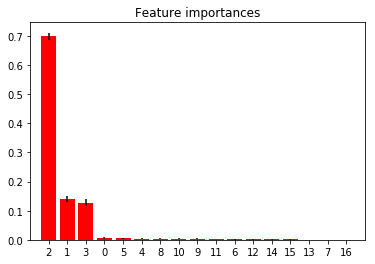

In [26]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

# Build a classification task using 3 informative features

# Build a forest and compute the feature importances
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

forest.fit(X, y)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

In [27]:
#Predict value for X_test
y_pred_logistic=classifier.predict(X_test)

In [28]:
#check coff of logistic regression
classifier.coef_

array([[ 2.25785013e-03, -3.64993124e-03, -1.11064492e+00,
        -4.68507061e-03,  3.19236803e-03,  3.97283282e-03,
         6.20051594e-03, -4.91287316e-03,  5.75101007e-03,
         2.05504237e-03, -1.05311284e-02, -1.15260424e-02,
        -3.81949474e-03, -1.08244786e-03, -1.22834539e-02,
         1.15825501e-02, -3.72476429e-03]])

In [29]:
#check the accuracy and confusion matrix
conf_met=confusion_matrix(y_test,y_pred_logistic)
acc_logistic=accuracy_score(y_test,y_pred_logistic)
print(acc_logistic)
print(conf_met)

0.8460033117567364
[[10736     0]
 [ 2046   504]]


In [30]:
#Import randomforest algo
rand_classifier=RandomForestClassifier(n_estimators=10 ,random_state=0)
rand_classifier.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

In [31]:
#check the accuracy and confusion matrix
y_pred_rand=rand_classifier.predict(X_test)
conf_met_rand=confusion_matrix(y_test,y_pred_rand)
acc_rand=accuracy_score(y_test,y_pred_rand)
print(acc_rand)
print(conf_met_rand)

0.8980882131567063
[[10582   154]
 [ 1200  1350]]


In [36]:
#Import XGB
class_xgboost=XGBClassifier(random_state=0)
class_xgboost.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

In [37]:

#check the accuracy and confusion matrix
y_pred_xgboost=class_naive.predict(X_test)
conf_met_xgboost=confusion_matrix(y_test,y_pred_xgboost)
acc_xgboost=accuracy_score(y_test,y_pred_xgboost)
print(acc_xgboost)
print(conf_met_xgboost)

0.827186512118019
[[9485 1251]
 [1045 1505]]


## Creating Pickle File for model

In [38]:
#import pickle library

#create the file paths
model_file_path=os.path.join(os.path.pardir,'models','agent_predictor_model_xgboost_without_state.pkl')

#open the files to write
model_file_pickle=open(model_file_path,'wb')

#write in file
pickle.dump(class_xgboost,model_file_pickle)

#close the file
model_file_pickle.close()

In [39]:
import os
import pickle
#create the file paths
model_file_path=os.path.join(os.path.pardir,'models','agent_predictor_model_xgboost_without_state.pkl')

#open files in read mode
model_file_pickle=open(model_file_path,'rb')

#load files
agent_predictor_model=pickle.load(model_file_pickle)

#close the file
model_file_pickle.close()

In [40]:
#check the model
agent_predictor_model

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=nan, n_estimators=100,
       n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

[0.         0.00333081 0.96130484 0.00232994 0.00289597 0.00355567
 0.         0.         0.00439839 0.00492319 0.00153249 0.00229331
 0.00467328 0.         0.00524115 0.00352098 0.        ]


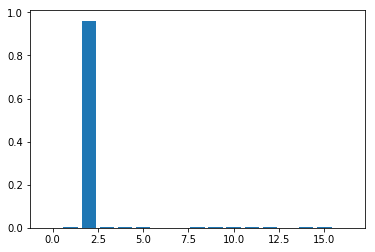

In [41]:
%matplotlib inline
# plot feature importance manually
from numpy import loadtxt

from matplotlib import pyplot

# feature importance
print(agent_predictor_model.feature_importances_)
# plot
pyplot.bar(range(len(agent_predictor_model.feature_importances_)), agent_predictor_model.feature_importances_)
pyplot.show()

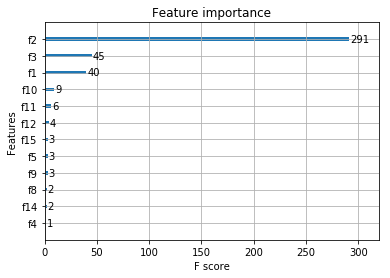

In [42]:
from numpy import loadtxt

from xgboost import plot_importance
from matplotlib import pyplot
# load data


# plot feature importance
plot_importance(agent_predictor_model)
pyplot.show()

In [90]:
X_train.head()

AttributeError: 'numpy.ndarray' object has no attribute 'head'

In [91]:
df2=pd.DataFrame(data=X[:,:])
df2.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,1,22,905.08,1,1,0,0,0,1,1,1,0,0,0,0,0,0
1,1,36,54537.5,14,0,0,0,0,0,0,0,0,0,0,1,1,0
2,1,36,14669.6,13,1,0,0,0,0,1,0,0,0,0,1,1,0
3,1,21,91096.9,1,1,0,0,0,0,1,1,0,0,0,0,0,0
4,0,42,97931.3,20,0,1,0,0,1,1,0,0,0,0,0,0,0


In [92]:
X_train = pd.DataFrame({'Gender':X_train[:,0],'Age':X_train[:,1],'Salary':X_train[:,2],'LOS':X_train[:,3],'Marital StatSs':X_train[:,4]
                        ,'Iowa Resident':X_train[:,5],'Crop':X_train[:,6],'Surety':X_train[:,7],'Accident and Health':X_train[:,8],'Life':X_train[:,9]
                       ,'Variable Life, Variable Annuity':X_train[:,10],'Personal Lines':X_train[:,11],'Credit':X_train[:,12],'Excess and Surplus Lines':X_train[:,13]
                       ,'Property':X_train[:,14],'Casualty':X_train[:,15],'Reciprocal Authority':X_train[:,16]})

In [93]:
X_train.head()

,Gender,Age,Salary,LOS,Marital StatSs,Iowa Resident,Crop,Surety,Accident and Health,Life,"Variable Life, Variable Annuity",Personal Lines,Credit,Excess and Surplus Lines,Property,Casualty,Reciprocal Authority
0,0,26,72178.3,6,1,0,0,0,0,0,0,1,0,0,0,0,0
1,1,25,33984.6,3,0,0,0,0,0,0,0,0,0,0,1,1,0
2,0,68,46221.3,1,0,0,0,0,1,1,0,0,0,0,1,1,0
3,1,30,78360.9,10,0,0,0,0,1,1,0,0,0,0,0,0,0
4,0,53,41586.6,9,0,0,0,0,1,1,0,0,0,0,0,0,0


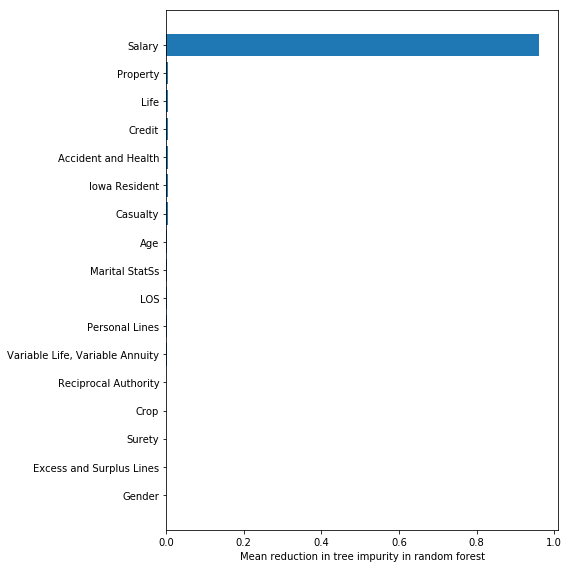

In [118]:
# Feature importance dataframe
imp_df = pd.DataFrame({'feature': X_train.columns.values,
                       'importance': agent_predictor_model.feature_importances_})
 
# Reorder by importance
ordered_df = imp_df.sort_values(by='importance')
imp_range=range(1,len(imp_df.index)+1)
 
## Barplot with confidence intervals
height = ordered_df['importance']
bars = ordered_df['feature']
y_pos = np.arange(len(bars))

# Create horizontal bars
plt.barh(y_pos, height)
 
# Create names on the y-axis
plt.yticks(y_pos, bars)

plt.xlabel("Mean reduction in tree impurity in random forest")

plt.tight_layout()
# Show graphic
plt.show()

#Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools

#scikit-learn package (https://pypi.org/project/scikit-learn)
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.metrics.scorer import make_scorer

#eli5 package (https://eli5.readthedocs.io/en/latest)
import eli5
from eli5.sklearn import PermutationImportance

#lime package (https://github.com/marcotcr/lime)
#import lime
#import lime.lime_tabular

#shap package (https://github.com/slundberg/shap)
import shap

#Load Wisconsin diagnostic breast cancer data from UCI #

url_prefix = "https://archive.ics.uci.edu/ml/machine-learning-databases/"
#if url url does not work you can use this mirror instead:
#url_prefix = "http://mlr.cs.umass.edu/ml/machine-learning-databases/"

data_url = url_prefix + "breast-cancer-wisconsin/wdbc.data"

#Define column labels 
id_status = ["ID", "diagnosis"]

#Mean, standard error and maximum ('worst') values are available for features 
#computed on a collection of cells in a tissue 
column_labels = itertools.product(["radius", "texture", "perimeter", "area",
                                  "smoothness", "compactness", "concavity",
                                  "concave_points", "symmetry", "fractal_dim"],
                                 ["mean","std","max"])

column_labels = id_status + [f"{t}_{f}" for f, t in column_labels]

#Read into pandas DataFrame
df = pd.read_csv(data_url, header=None, names = column_labels)

#Define feature set
X = df.drop('ID', axis=1).drop('diagnosis', axis=1)

#Define diagnosis as integer: malignant (1) or benign (0)
y = (df['diagnosis'] == "M")*1

#Split train and test set.
RANDOM_STATE = 123
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,
                                                    stratify=y,
                                                    random_state=RANDOM_STATE)

#Train random forest classification model
model = RandomForestClassifier(max_depth=4, random_state=RANDOM_STATE)
model.fit(X_train, y_train)

# Diagnosis prediction
y_predict = model.predict(X_test)

# Probability of malignant tissue produced by the model
y_prob = [probs[1] for probs in model.predict_proba(X_test)]

#Accuracy on test set
print(f"Test accuracy: {accuracy_score(y_test, y_predict).round(2)}")

# Confusion matrix test set
pd.DataFrame(
    confusion_matrix(y_test, y_predict),
    columns=['Predicted Benign', 'Predicted Malignant'],
    index=['Benign', 'Malignant']
)

# Compute area under the curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

#Set default figure size
plt.rcParams['figure.figsize'] = (8,8)

# Plot ROC curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Diagnosing Breast Cancer")
plt.legend(loc="lower right")
plt.show()


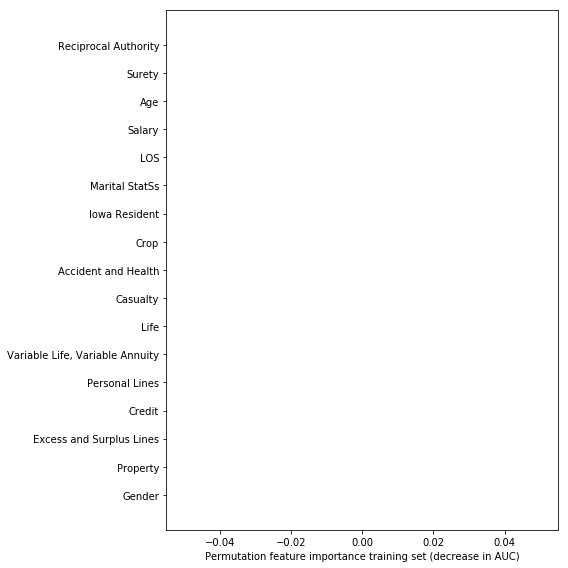

In [119]:
# Feature importance based on TRAINING set

perm_test = PermutationImportance(agent_predictor_model, scoring=make_scorer(roc_auc_score),
                                   n_iter=50, random_state=RANDOM_STATE, cv="prefit")

# fit and see the permuation importances
perm_test.fit(X_train, y_train)

imp_df = eli5.explain_weights_df(perm_test)
label_df = pd.DataFrame({'feature': [ "x" + str(i) for i in range(len(X_test.columns))], 'feature_name': X_test.columns.values})
imp_df = pd.merge(label_df, imp_df, on='feature', how='inner', validate="one_to_one")
 
# Reorder by importance
ordered_df = imp_df.sort_values(by='weight')
imp_range=range(1,len(imp_df.index)+1)
 

## Barplot with confidence intervals

height = ordered_df['weight']
bars = ordered_df['feature_name']
ci = 1.96 * ordered_df['std']
y_pos = np.arange(len(bars))

# Create horizontal bars
plt.barh(y_pos, height, xerr=ci)
 
# Create names on the y-axis
plt.yticks(y_pos, bars)

plt.xlabel("Permutation feature importance training set (decrease in AUC)")
plt.tight_layout()

# Show graphic
plt.show()




In [120]:
#Explain samples in test set
X_explain = X_test
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train.values,
                                                   feature_names=X_train.columns.values,
                                                   discretize_continuous=True,
                                                   class_names=["benign", "malign"],
                                                   mode="classification",
                                                   verbose=True,
                                                   random_state=RANDOM_STATE)

#Explaining first subject in test set using all 30 features
exp = explainer.explain_instance(X_explain.values[0,:],model.predict_proba, 
                                 num_features=30)
#Plot local explanation
plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

NameError: name 'lime' is not defined

In [121]:
# explain the model's predictions on test set using SHAP values
# same syntax works for xgboost, LightGBM, CatBoost, and some scikit-learn models
explainer = shap.TreeExplainer(model)

# shap_values consists of a list of two matrices of dimension samplesize x #features
# The first matrix uses average nr of benign samples as base value
# The second matrix which is used below uses average nr of malignant samples as base value 
shap_values = explainer.shap_values(X_explain)


# Interactive visualization of the explanation of the first subject
# in the test set (X_explain).
# It shows the relative contribution of features to get from the base value of malignant
# samples(average value)
# to the output value (1 in case of malignant sample)
# the numbers at the bottom show the actual values for this sample.
shap.initjs() #initialize javascript in cell
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], X_explain.iloc[0,:])


In [123]:
#Interactive visualization of all sample/feature Shapley values
#It is possible to show the relative contribution of individual features for all
# samples on the y-axis as well.
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X_explain)

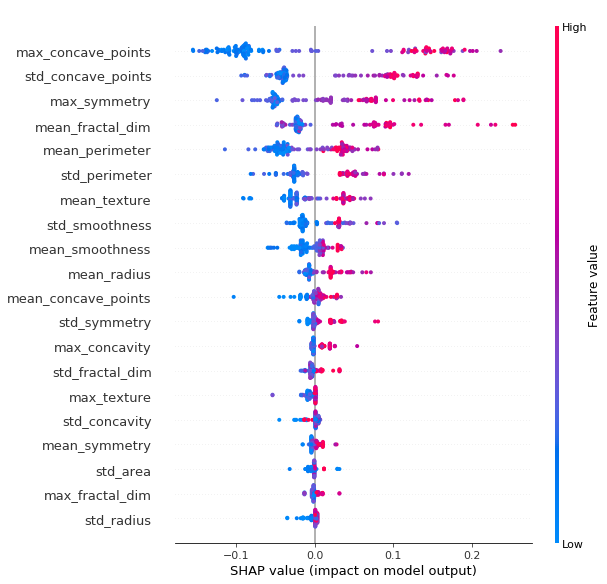

In [62]:
#A summary plot with the shapley value (feature importance) 
shap.summary_plot(shap_values[1], X_explain)

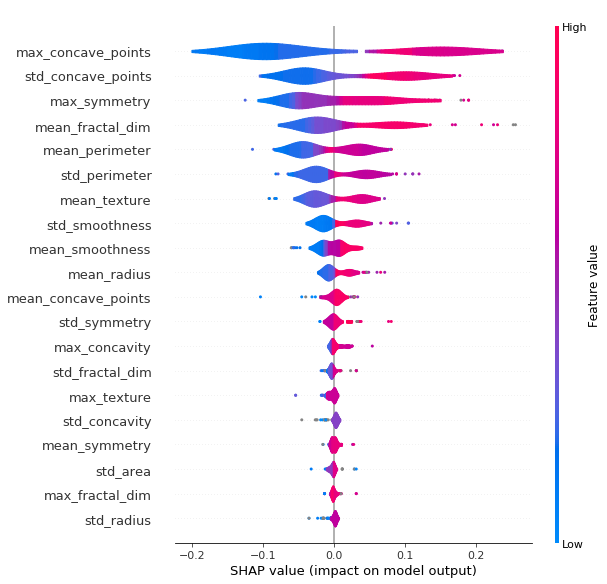

In [63]:
#Same as above, but with violin plots to better see the distribution of shapley values 
shap.summary_plot(shap_values[1], X_explain, plot_type="violin")

In [129]:
num_of_inputs=int(input("Please enter number of inputs will be provided"))
numlist=list()

for i in range(*args):
    input_val=input("Enter the values")
    numlist.append(input_val)

output=numlist[num_of_inputs]
print(output)

Please enter number of inputs will be provided2


NameError: name 'args' is not defined

In [134]:
num_of_inputs=int(input("Please enter number of inputs will be provided"))

def find_from_last(*args,**kwargs):
    numlist=list()
    for i in range(*args):
        input_val=input("Enter the values")
        numlist.append(input_val)
    
    try:
        output=numlist[-num_of_inputs]
        return output
    except:
        output='NIL'
        return output

out=find_from_last(*args)
print(out)

Please enter number of inputs will be provided2


NameError: name 'args' is not defined